# Importing Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import sklearn
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, classification_report
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA

import boto3
import sagemaker
from sagemaker import get_execution_role
#from sagemaker.sklearn import SKLearn   
from sagemaker.sklearn.estimator import SKLearn
from sagemaker.tuner import HyperparameterTuner, IntegerParameter, CategoricalParameter




sagemaker.config INFO - Not applying SDK defaults from location: /etc/xdg/xdg-ubuntu/sagemaker/config.yaml
sagemaker.config INFO - Not applying SDK defaults from location: /home/naser/.config/sagemaker/config.yaml


# Uploading Dataset

In [2]:
df_original = pd.read_excel("DryBeanDataset/Dry_Bean_Dataset.xlsx")
df_original.to_csv("dry_bean_dataset.csv", index=False)
df_original.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


# Exploratory Data Analysis (EDA)

In [3]:
df_original.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

In [4]:
df_original.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1985.370000,738.860153,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


In [5]:
features = df_original.columns[:-1].to_list()
print(f"features: {features}")

label = df_original.columns[-1]
print(f"\nlabel: {label}")

features: ['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength', 'AspectRation', 'Eccentricity', 'ConvexArea', 'EquivDiameter', 'Extent', 'Solidity', 'roundness', 'Compactness', 'ShapeFactor1', 'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4']

label: Class


In [6]:
df_original['Class'].unique()

array(['SEKER', 'BARBUNYA', 'BOMBAY', 'CALI', 'HOROZ', 'SIRA', 'DERMASON'],
      dtype=object)

In [7]:
df_original.isnull().sum()

Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    0
AspectRation       0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           0
roundness          0
Compactness        0
ShapeFactor1       0
ShapeFactor2       0
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64

# Correlation Analysis of Numerical Features


<Axes: >

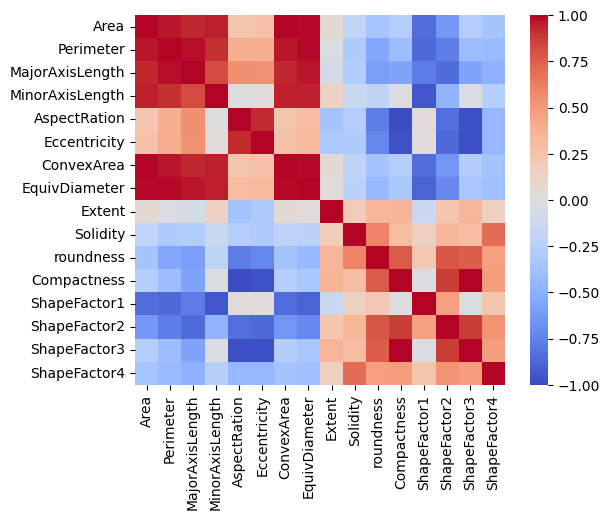

In [8]:
correlation = df_original.corr(numeric_only=True)
sns.heatmap(correlation, center=0, square=True, cmap="coolwarm", vmin=-1, vmax=1)

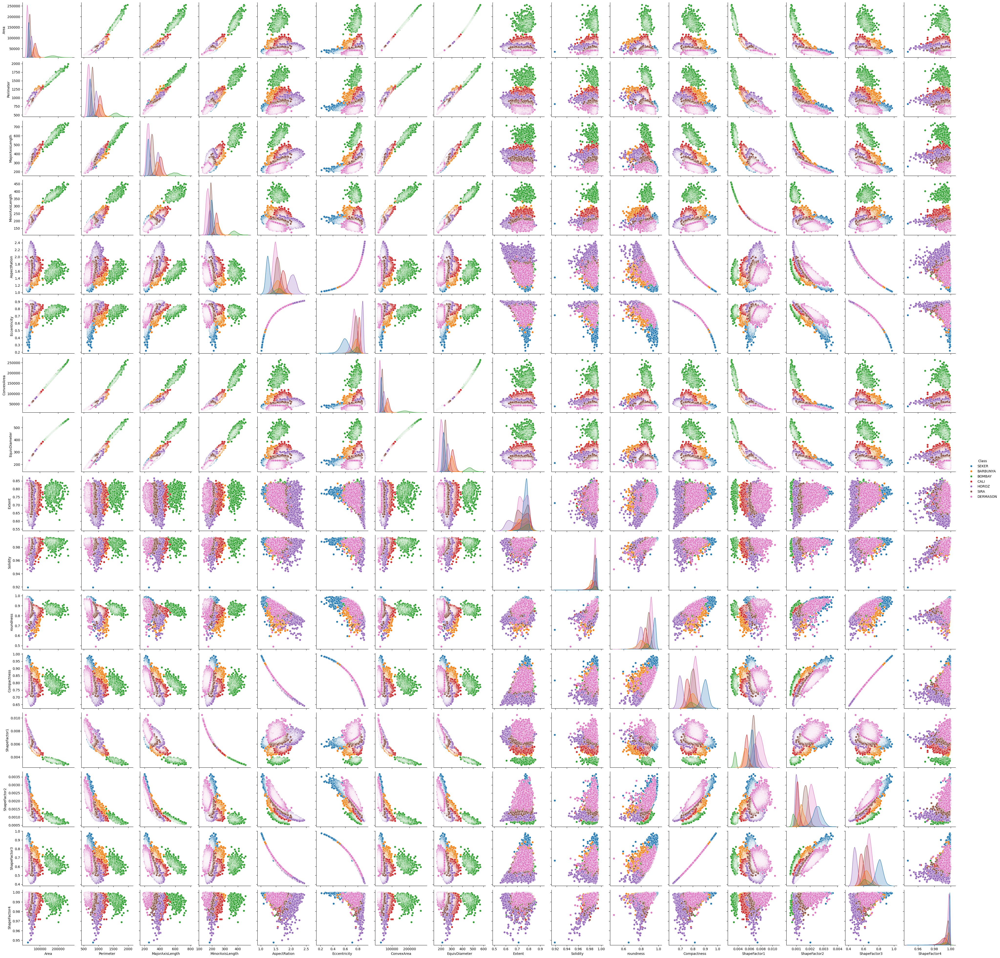

In [9]:
sns.pairplot(df_original, hue='Class')

# Dimensionality Reduction

### Principal Component Analysis (PCA)

**Principal Component Analysis (PCA)** is an **unsupervised dimensionality reduction technique** that transforms a set of possibly correlated features into a smaller set of **uncorrelated variables** called *principal components*.

- Each principal component is a **linear combination of the original features**.
- The components are ordered so that:
  1. The **first** captures the **maximum variance**.
  2. The **second** captures the **next highest variance**, and so on.
- By keeping only the first few components, PCA **reduces dimensionality** while **preserving as much information (variance) as possible**.

### Common Uses of PCA
- **Visualization**: projecting high-dimensional data into 2D/3D.
- **Noise reduction**.
- **Speeding up training** and avoiding **multicollinearity** in ML models.


In [10]:
X = df_original.drop(columns=["Class"])   # features
y = df_original["Class"]                  # label

##Standardize the features (very important for PCA)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

##PCA Hyperparameter Tuning and Fitting
cumulative_pca = []
n_components_pca_range = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]  
pca = PCA()
param_grid_pca = {'n_components': n_components_pca_range}
grid_search_pca = GridSearchCV(estimator=pca, param_grid=param_grid_pca, cv=5, n_jobs=-1)
grid_search_pca.fit(X_scaled)
best_n_components_pca = grid_search_pca.best_params_['n_components']

pca = PCA(n_components=best_n_components_pca)
X_pca = pca.fit_transform(X_scaled)

X_pca.shape

(13611, 3)

In [11]:
print(f"Explained Variance Ratio for Each Principal Component:")
for i, variance_explained in enumerate(pca.explained_variance_ratio_):
    print(f"PC{i + 1}: {variance_explained * 100:.2f}%")
    cumulative_pca.append(variance_explained)

print(f"Total explained variance by {len(cumulative_pca)} selected PCs: {sum(cumulative_pca) * 100:.2f}%") 

# Put PCA output into DataFrame for visualization
pca_df = pd.DataFrame(data=X_pca, columns=["PC1", "PC2", "PC3"])
pca_df["Class"] = y.values

pca_df.head()

Explained Variance Ratio for Each Principal Component:
PC1: 55.47%
PC2: 26.43%
PC3: 8.01%
Total explained variance by 3 selected PCs: 89.90%


,PC1,PC2,PC3,Class
0,-4.981561,1.824697,-0.749021,SEKER
1,-5.436792,2.932365,-2.182374,SEKER
2,-4.758088,1.826884,-0.514038,SEKER
3,-4.300541,2.003661,-3.554447,SEKER
4,-6.349340,4.088205,-1.179199,SEKER


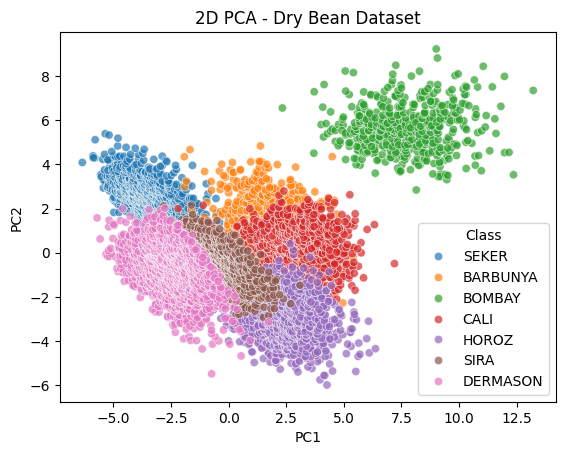

In [12]:
##PCA Visualizing
sns.scatterplot(
    x="PC1", y="PC2",
    hue="Class",      #Colors points based on their class (bean types).
    data=pca_df,
    alpha=0.7         #Makes points slightly transparent so overlapping points are easier to see.
)
plt.title("2D PCA - Dry Bean Dataset")
plt.show()

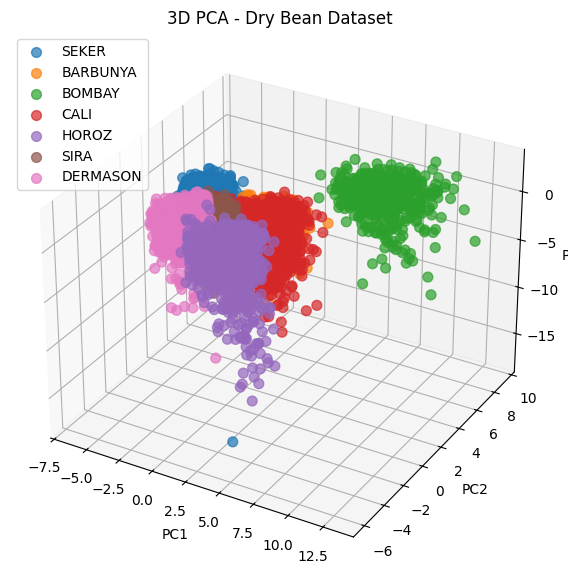

In [13]:
from mpl_toolkits.mplot3d import Axes3D  # for 3D plotting

fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(111, projection='3d')

# Plot each class with different colors automatically
classes = pca_df["Class"].unique()
for cls in classes:
    subset = pca_df[pca_df["Class"] == cls]
    ax.scatter(
        subset["PC1"], subset["PC2"], subset["PC3"],
        label=cls, s=50, alpha=0.7
    )

ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")
ax.set_title("3D PCA - Dry Bean Dataset")
ax.legend()
plt.show()

# Encoding Categorical Variables

Machine learning algorithms require numeric input, so **categorical data** must be encoded. There are several common techniques:

### 1. Label Encoding
- Converts each unique category into an **integer**.
- Example: `['Red', 'Green', 'Blue']` → `[0, 1, 2]`
- Commonly used for **target labels** in classification problems.
- **Limitation:** Imposes an ordinal relationship even if none exists, which may mislead some algorithms.

### 2. One-Hot Encoding
- Creates **binary columns** for each category.
- Example: `['Red', 'Green', 'Blue']` →  
  |Red|Green|Blue|  
  |---|---|---|  
  |1|0|0|  
  |0|1|0|  
  |0|0|1|
- Suitable for **nominal categorical features**.
- Often implemented via `pd.get_dummies()` or `OneHotEncoder` in scikit-learn.

### 3. Ordinal Encoding
- Assigns integers to categories **based on a specific order**.
- Example: `['Low', 'Medium', 'High']` → `[0, 1, 2]`
- Useful when there is a **natural order** in the categories.

### 4. Target Encoding (Mean Encoding)
- Replaces categories with **statistics from the target variable** (like mean of target per category).
- Example: In a binary classification, category `"A"` may be replaced by the proportion of positive labels in `"A"`.
- Can **leak information** if not applied carefully (use on train set only).

### 5. Frequency / Count Encoding
- Replace each category by its **frequency or count** in the dataset.
- Helps algorithms that can leverage relative importance of categories.

---

**Tip:**  
- For **features**: one-hot or target/frequency encoding.  
- For **target labels**: label encoding is usually sufficient.


In [14]:
# Label Encoding Original Dataset
df_encoded = df_original.copy(deep=True)

le = LabelEncoder()
df_encoded["Class"] = le.fit_transform(df_encoded["Class"])
df_encoded.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,5
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,5
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,5
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,5
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,5


In [15]:
# Label Encoding PCA Dataset
df_pca_encoded = pca_df.copy(deep=True)
le = LabelEncoder()

df_pca_encoded['Class'] = le.fit_transform(df_pca_encoded['Class'])

In [16]:
df_pca_encoded.head()

,PC1,PC2,PC3,Class
0,-4.981561,1.824697,-0.749021,5
1,-5.436792,2.932365,-2.182374,5
2,-4.758088,1.826884,-0.514038,5
3,-4.300541,2.003661,-3.554447,5
4,-6.349340,4.088205,-1.179199,5


In [17]:
# Choosing between original dataset and pca transformed dataset for ML modeling
#df = df_pca_encoded
df = df_encoded

# Training and Test Split

In [18]:
train, test = train_test_split(df, random_state=42, test_size=0.2)

# Save as CSV to upload to S3
train.to_csv("dry_bean_train.csv", index=False)
test.to_csv("dry_bean_test.csv", index=False)

# Introduction to Amazon SageMaker for Beginners

This guide explains SageMaker concepts and workflow for someone who has little to no prior experience with SageMaker. It uses simple analogies and key explanations to make the concepts easier to understand.

---

## SageMaker Python SDK: Your ML Toolbox 🧰

Imagine you want to **build a birdhouse**. You could start from scratch using raw wood and nails, but it would take a lot longer and be harder.  

Instead, someone gives you a **toolbox**:

- **Hammer, nails, saw** → Tools to perform specific tasks (like Python libraries and APIs).  
- **Instructions** → Documentation explaining how to use the tools.  
- **Pre-cut pieces or templates** → Sample code to speed up your work.  

The **SageMaker Python SDK** is like this toolbox, providing ready-made tools and instructions to build, train, and deploy machine learning models on AWS without handling all the complicated AWS infrastructure yourself.

---

## Understanding the S3 Client :
`boto3.client('s3')`

We are creating a **software helper** (called a **"client"**) in Python that knows how to talk to the **Amazon S3 service**,Amazon’s cloud storage service. To interact with it from Python, we use **Boto3**, AWS’s official Python SDK.  

- **Client Object**: Think of it as a software helper or a translator between Python and S3.  
- **Methods**: `.upload_file()`, `.download_file()`, `.list_objects_v2()` – these let you store and retrieve files easily.  
- **Analogy**: S3 is a huge warehouse:
  - **Buckets** → Rooms  
  - **Folders** → Shelves  
  - **Files** → Boxes  
  - The S3 client is a warehouse worker who knows the rules and moves boxes for you.

---

## SageMaker Session, Region, and Default Bucket

- **SageMaker Session (`sagemaker.Session()`)**
  - Keeps track of your AWS credentials and manages interactions with SageMaker services.  

- **Region**
  - Each AWS resource (S3, SageMaker, EC2, etc.) belongs to a region (e.g., `eu-central-1`).  
  - Using the session’s region ensures consistency across all services without hardcoding.

- **Default Bucket**
  - SageMaker can automatically create a default S3 bucket to store training data, model artifacts, and temporary files.  
  - Useful for experiments and quick setups without manually creating a bucket.

**Best Practice:** Always use the SageMaker session to fetch the region and default bucket for portability and consistency.

---

## SageMaker Execution Role

- The execution role is a **set of permissions** allowing SageMaker to access AWS services on your behalf (S3, CloudWatch, ECR, etc.).  
- Needed for:
  - **Training jobs** → Lets SageMaker read training data and write model artifacts.  
  - **Model deployment** → Allows SageMaker to create and manage endpoints.  
  - **Processing jobs** → Lets scripts run on SageMaker-managed infrastructure.  
  - **Batch Transform jobs** → Enables large-scale inference.  

- **Not needed** for local Python operations like pandas, numpy, or direct S3 uploads with `boto3`.

**Rule of Thumb:** 
- Whenever SageMaker runs something on AWS infrastructure for you, you need the execution role.
- If running code locally(e.g., in Linux, etc.), provide the full ARN of your SageMaker execution role as follows:
  
  - Go to AWS Management Console → IAM → Roles → AmazonSageMaker-ExecutionRole-<date> → Copy the Role ARN at the top.

---

## SageMaker Workflow: From Data to Endpoint

Here’s the typical pipeline for deploying a machine learning model using SageMaker:

1. **Set Up Session and Role**
   - Initialize SageMaker session.
   - Retrieve region and default bucket.
   - Define execution role for AWS permissions.

2. **Upload Data to S3**
   - Store training and test datasets in S3 using the session or `boto3` client.

3. **Define Training Script**
   - Prepare a Python script (`script.py`) containing:
     - Data loading and preprocessing.
     - Model definition and training (e.g., Random Forest).
     - Model evaluation and metrics reporting.
     - Model serialization (`joblib`).

4. **Create Estimator**
   - Define a SageMaker Estimator specifying:
     - Training script, instance type, count, hyperparameters.
     - Execution role.
     - Optional settings like spot instances or max runtime.

5. **Train the Model**
   - Launch training job on SageMaker.
   - Monitor logs and wait for job completion.
   - SageMaker stores trained model artifacts in S3.

6. **Locate Model Artifact**
   - Retrieve the S3 URI of the trained model artifact (e.g., `model.tar.gz` containing `model.joblib`).

7. **Deploy Model as Endpoint**
   - Use `SKLearnModel` or `Estimator.deploy()` to create an endpoint.
   - SageMaker provisions an instance and hosts the model for real-time predictions.

8. **Invoke Endpoint for Predictions**
   - Send input data to the endpoint using a predictor.
   - Receive predictions (e.g., price categories for mobile phones).

9. **Clean Up**
   - Delete the endpoint when no longer needed to avoid charges.

---

This workflow allows you to **train, evaluate, deploy, and predict** using AWS SageMaker while minimizing manual management of servers or infrastructure.


In [19]:
# -------------------------
# Start SageMaker session
# -------------------------
sagemaker_session = sagemaker.Session()

# Default bucket and AWS region
default_bucket_name = sagemaker_session.default_bucket()
print("My default S3 bucket:", default_bucket_name)

region = sagemaker_session.boto_session.region_name
print("Using AWS region:", region)

# -------------------------
# Execution role
# -------------------------
# If inside SageMaker Studio/Notebook
# role = sagemaker.get_execution_role()

# If running locally, provide the full ARN of your SageMaker execution role
# Go to AWS Management Console → IAM → Roles → AmazonSageMaker-ExecutionRole-<date> → Copy the Role ARN at the top.
role = "arn:aws:iam::577947472108:role/service-role/AmazonSageMaker-ExecutionRole-20250812T103590"
       
# -------------------------
# S3 Upload
# -------------------------
bucket_name = default_bucket_name
prefix = "dry_bean_classification"  # Folder in S3
local_file = "dry_bean_dataset.csv"
s3_key = f"{prefix}/data/{local_file}"  # path in S3 bucket: s3_data_path

# Create S3 client: used for uploading/downloading files from S3.
s3_client = boto3.client("s3", region_name=region)

# Upload file
try:
    s3_client.upload_file(local_file, bucket_name, s3_key)
    print(f"✅ Uploaded {local_file} to S3://{bucket_name}/{s3_key}")
except Exception as e:
    print(f"❌ Upload failed: {e}")

My default S3 bucket: sagemaker-eu-central-1-577947472108
Using AWS region: eu-central-1
✅ Uploaded dry_bean_dataset.csv to S3://sagemaker-eu-central-1-577947472108/dry_bean_classification/data/dry_bean_dataset.csv


In [20]:
# Upload a file and return S3 URI directly.
s3_data_path = f"{prefix}/data"    
train_uri_s3 = sagemaker_session.upload_data(path='dry_bean_train.csv', bucket=bucket_name, key_prefix=s3_data_path)
test_uri_s3 = sagemaker_session.upload_data(path='dry_bean_test.csv', bucket=bucket_name, key_prefix=s3_data_path)

print("Train data S3 URI:", train_uri_s3)
print("Test data S3 URI:", test_uri_s3)

Train data S3 URI: s3://sagemaker-eu-central-1-577947472108/dry_bean_classification/data/dry_bean_train.csv
Test data S3 URI: s3://sagemaker-eu-central-1-577947472108/dry_bean_classification/data/dry_bean_test.csv


# Model Training Script for SageMaker

This script (`script.py`) trains a Random Forest model on input CSV data using SageMaker and saves the trained model for deployment. It performs the following steps:

- `%%` → Indicates that the command applies to the entire cell.  
- `writefile` → Tells Jupyter to save the cell’s content into a file.  
- `script.py` → The name of the file to be created (or overwritten).  
1. **Imports Libraries**: Uses `pandas`, `numpy`, `sklearn`, `joblib`, and `boto3`.  
2. **Model Loading Function**: The `model_fn(model_dir)` function loads training and test CSV files from SageMaker channels.  
3. **Argument Parsing**: Accepts hyperparameters (`--n-estimators`, `--min-samples-leaf`), data directories (`--train`, `--test`), file names (`--train-file`, `--test-file`), and model directory (`--model-dir`).  
4. **Data Loading**: Reads training and testing CSV files from S3 channels or local paths.  
5. **Prepare Features and Labels**: Splits data into features (`X_train`, `X_test`) and target labels (`y_train`, `y_test`).  
6. **Train the Model**: Trains a `RandomForestClassifier` using the specified hyperparameters.  
7. **Validate the Model**: Evaluates the model on test data using accuracy and classification report.  
8. **Persist the Model**: Saves the trained model to the `model_dir` using `joblib` so it can be loaded later for inference.


### argparse (Python)

`argparse` is a Python module for handling **command-line arguments**.  
It lets you pass values (like hyperparameters, file paths, etc.) to a script when running it, instead of hardcoding them.  

- `ArgumentParser()` → creates the parser. It defines what arguments to expect.
- `add_argument()` → defines expected arguments  
- `parse_args()` → reads the values provided at runtime from the command line.

SageMaker’s training jobs send **hyperparameters** and **environment variables** to your script via **command-line arguments**.  
With `argparse`, your script can catch them automatically.

Without `argparse`, SageMaker wouldn’t be able to tell your script:

- where the training/test data is,  
- where to save the model,  
- what hyperparameters to use.


Example:
```bash
python script.py --n-estimators 10


----
### Pandas Brackets: One vs Two

- **Single brackets `[ ]`:**
   If you pass a **string** (e.g., `df["col"]`), you get a **Series** (1D).  
    ```python
    y_train = train_df[label]   # returns a Series
    ```

- **Double brackets `[[ ]]`:**
  If you pass a **list of columns** (even one), you get a **DataFrame** (2D).  
    ```python
    y_train = train_df[[label]]   # returns a DataFrame
    ```
---
- **In our code:**
  ```python
  X_train = train_df[features]   # ✅ features is a list → DataFrame
  y_train = train_df[label]      # ✅ label is a string → Series


-----
### joblib: Save & Load Models

`joblib` is used to **persist and save trained ML models permanently** efficiently.

- import joblib
- joblib.dump(model, "model.joblib") → `save`
- model = joblib.load("model.joblib") → `load`

In [21]:
%%writefile script.py

import argparse # allows passing hyperparameters and file paths as command-line arguments (SageMaker uses this to inject configs).
import os       # used to build file paths and access environment variables.
import joblib   # for saving and loading ML models efficiently.
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import balanced_accuracy_score

#this function load the model
def model_fn(model_dir):
    clf = joblib.load(os.path.join(model_dir, "model.joblib"))
    return clf

if __name__ == "__main__":
    print("extracting arguments")
    parser = argparse.ArgumentParser()

    # Hyperparameters sent by the client are passed as command-line arguments to the script.
    parser.add_argument("--n-estimators", type=int, default=10)
    parser.add_argument("--min-samples-leaf", type=int, default=3)
    parser.add_argument("--max-depth", type=int, default=None)
    parser.add_argument("--max-features", type=str, default="auto")

    # Data, model, and output directories
    parser.add_argument("--model-dir", type=str, default=os.environ.get("SM_MODEL_DIR")) # where to save the trained model.
    parser.add_argument("--train", type=str, default=os.environ.get("SM_CHANNEL_TRAIN")) # path to the training data folder inside the container.
    parser.add_argument("--test", type=str, default=os.environ.get("SM_CHANNEL_TEST")) # path to the test data folder inside the container.
    parser.add_argument("--train-file", type=str, default="dry_bean_train.csv") # tell the script which CSV file to load inside the train directories.
    parser.add_argument("--test-file", type=str, default="dry_bean_test.csv") # tell the script which CSV file to load inside the test directories.
    args, _ = parser.parse_known_args() # This reads what was passed at the command line and stores it in args.
   
    print("reading data")

    train_df = pd.read_csv(os.path.join(args.train, args.train_file))
    test_df = pd.read_csv(os.path.join(args.test, args.test_file))

    print("building training and testing datasets")

    X_train = train_df.drop("Class", axis=1)
    X_test = test_df.drop("Class", axis=1)
    y_train = train_df["Class"]
    y_test = test_df["Class"]

    # Train model
    print("training model")

    model = RandomForestClassifier(
       n_estimators=args.n_estimators,
       min_samples_leaf=args.min_samples_leaf,
       max_depth=args.max_depth,
       max_features=args.max_features,
       n_jobs=-1,   # use all CPU cores.
        )

    model.fit(X_train, y_train)

    # Print abs error
    print("validating model")

    bal_acc_train = balanced_accuracy_score(y_train, model.predict(X_train))
    bal_acc_test = balanced_accuracy_score(y_test, model.predict(X_test))

    # SageMaker tuner cares only about test (validation) metric
    print(f"Balanced Accuracy: {bal_acc_test:.4f}")         # MUST match the metric_definitions regex
    print(f"Train balanced accuracy: {bal_acc_train:.3f}")  # Optional, just for info
    print(f"Test balanced accuracy: {bal_acc_test:.3f}")    # Optional, just for logging

    #Save trained model into SageMaker’s model directory (SM_MODEL_DIR). "model.joblib" is the filename we are giving to our saved model.
    path = os.path.join(args.model_dir, "model.joblib")  # Build the save path
    joblib.dump(model, path)      # Save the trained model
    print("model persisted at " + path)

Overwriting script.py


### Define and Configure the SageMaker SKLearn Estimator

This cell sets up the SageMaker `SKLearn` estimator, specifying:
- The training script (`script.py`) as the entry point.
- The IAM execution role for SageMaker.
- Instance type and count.
- SKLearn framework version.
- Hyperparameters for the Random Forest model (`n_estimators` and `min_samples_leaf`).
- Spot instance usage, maximum wait, and run time.


In [22]:
# -----------------------------
#  SKLearn Estimator from the SageMaker Python SDK
# -----------------------------
FRAMEWORK_VERSION = "0.23-1"   #https://docs.aws.amazon.com/sagemaker/latest/dg/sklearn.html

sklearn_estimator = SKLearn(
   entry_point="script.py",
   role = "arn:aws:iam::577947472108:role/service-role/AmazonSageMaker-ExecutionRole-20250812T103590",
   instance_count=1,                # How many machines to spin up.
   instance_type="ml.c5.xlarge",    #https://aws.amazon.com/sagemaker/ai/pricing/#Instance_details
   framework_version=FRAMEWORK_VERSION,
   base_job_name="rf-scikit",
   hyperparameters={
       "n-estimators": 100,
       "min-samples-leaf": 3,
   },
   sagemaker_session=sagemaker_session,
   use_spot_instances = True,
   max_wait = 7200, 
   max_run = 3600
)

# -----------------------------
# Define Hyperparameter Ranges
# -----------------------------
hyperparameter_ranges = {
    "n-estimators": IntegerParameter(50, 200),
    "min-samples-leaf": IntegerParameter(1, 5),
    "max_depth": IntegerParameter(5, 20),
    "max_features": CategoricalParameter(["auto", "sqrt", "log2"])
}

metric_definitions = [
    {'Name': 'balanced_accuracy', 'Regex': 'Balanced Accuracy: ([0-9\\.]+)'}]  


tuner = HyperparameterTuner(
    estimator=sklearn_estimator,
    objective_metric_name="balanced_accuracy",
    hyperparameter_ranges=hyperparameter_ranges,
    metric_definitions=metric_definitions,
    max_jobs=20,            # SageMaker will try up to 20 different hyperparameter combinations
    max_parallel_jobs=4     # SageMaker can run 4 training jobs simultaneously, speeding up the tuning process.
)

# Launching the Training Job

This step sends your training job to SageMaker:

- **`sklearn_estimator/tuner.fit()`**: Starts training your model using the provided training script and datasets.  
- **Input Channels**: A dictionary specifying where the training and test data are in S3 (`{"train": ..., "test": ...}`).  
- **`wait=True`**: Ensures the notebook waits until the training job finishes before moving on.  

Key Notes:

- SageMaker automatically provisions the specified instance type (`ml.c5.xlarge`) and handles the training environment.  
- Your model will be trained with the hyperparameters you defined in the estimator.  
- Once training is complete, the model artifact is saved in S3 and is ready for deployment or further analysis.


In [23]:
# Launch training job, with asynchronous call
tuner.fit({"train": train_uri_s3, "test": test_uri_s3}, wait=True)

No finished training job found associated with this estimator. Please make sure this estimator is only used for building workflow config
No finished training job found associated with this estimator. Please make sure this estimator is only used for building workflow config


............................................................................................................................!


### 📊 Hyperparameter Tuning Analysis

The SageMaker Hyperparameter Tuning Job explored different configurations for a Random Forest model.  
The main findings are:

- **Best performance:**  
  - Achieved a **balanced accuracy of ~0.9341** with  
    - `max_depth = 13`  
    - `max_features = "sqrt"`  
    - `min_samples_leaf = 3`  
    - `n_estimators = 85`

- **Effect of `max_features`:**  
  - `"sqrt"` consistently outperformed `"auto"`.  
  - Example: `"sqrt"` with depth=13 and 85 estimators reached **0.9341**, while `"auto"` gave only **0.9316**.

- **Effect of `n_estimators`:**  
  - Increasing trees from ~75 → 85 gave a small improvement (~0.002).  
  - Gains diminish beyond ~80 trees.

- **Effect of `max_depth`:**  
  - Depth values between **10 and 13** performed best.  
  - Both shallow (10) and deeper (13) models gave strong results.

- **Training stability:**  
  - All jobs completed successfully in ~79 seconds.  
  - Accuracy differences were minor (0.932–0.934), showing stable model behavior.

✅ **Conclusion:**  
The model performs best with `"sqrt"` feature selection, depth around **10–13**, and **~80 estimators**.  
Further tuning could refine results, but improvements will likely be marginal.


In [25]:
# Get tuner results in a df
results = tuner.analytics().dataframe()

while results.empty:
   time.sleep(1)
   results = tuner.analytics().dataframe()

results.head()

,max_depth,max_features,min-samples-leaf,n-estimators,TrainingJobName,TrainingJobStatus,FinalObjectiveValue,TrainingStartTime,TrainingEndTime,TrainingElapsedTimeSeconds
0,13.0,"""sqrt""",3.0,75.0,sagemaker-scikit-lea-250831-1951-020-cfb28599,Completed,0.9325,2025-08-31 20:00:19+02:00,2025-08-31 20:01:38+02:00,79.0
1,14.0,"""sqrt""",3.0,84.0,sagemaker-scikit-lea-250831-1951-019-4546aa27,Completed,0.9328,2025-08-31 20:00:11+02:00,2025-08-31 20:01:30+02:00,79.0
2,13.0,"""sqrt""",3.0,85.0,sagemaker-scikit-lea-250831-1951-018-f4b35991,Completed,0.9341,2025-08-31 20:00:07+02:00,2025-08-31 20:01:21+02:00,74.0
3,13.0,"""auto""",3.0,76.0,sagemaker-scikit-lea-250831-1951-017-977611e9,Completed,0.9316,2025-08-31 20:00:06+02:00,2025-08-31 20:01:25+02:00,79.0
4,10.0,"""sqrt""",3.0,76.0,sagemaker-scikit-lea-250831-1951-016-5171dd3d,Completed,0.9341,2025-08-31 19:58:13+02:00,2025-08-31 19:59:32+02:00,79.0


# Locate Trained Model Artifact in S3:

This cell retrieves the S3 location of the trained model: 
- **sm_boto3**: A SageMaker client used to make direct API calls to SageMaker, like describing training jobs, listing models, stopping jobs, etc.
- **Wait for Training Completion**: Ensures the training job has finished before fetching the artifact.
- **describe_training_job**: Returns metadata about the training job, including the S3 path of the trained model. -
- **artifact_path**: Stores the S3 URI of the trained model artifact(e.g., model.tar.gz), which contains the serialized model (like model.joblib).

---
### Step-by-Step Explanation: `["ModelArtifacts"]["S3ModelArtifacts"]`

#### 1. `sm_boto3.describe_training_job(...)`
- This function call returns a **Python dictionary** containing metadata about the training job.  
- For a SageMaker training job, the dictionary of metadata includes:
    - **Training job name** – a unique identifier for the job.
    - **Hyperparameters used** – e.g., `n_estimators`, `max_depth`.
    - **Status of the job** – `InProgress`, `Completed`, or `Failed`.
    - **Resource configuration** – instance type, number of instances, etc.
    - **Input and output locations** – S3 URIs for training data, validation data, and model artifacts.
    - **Start and end times** – timestamps of when the job ran.
    - **Logs** – pointers to logs for monitoring the job.


#### 2. `["ModelArtifacts"]`
- Accesses the value corresponding to the key `"ModelArtifacts"` in the returned dictionary.  
- This sub-dictionary contains details about the **saved model artifact**, including its **S3 path**.

#### 3. `["S3ModelArtifacts"]`
- Accesses the `"S3ModelArtifacts"` key within the `"ModelArtifacts"` dictionary.  
- This gives the **exact S3 URI** of the trained model file (e.g., `s3://bucket/path/model.tar.gz`).

#### Summary
- `describe_training_job(...)` → returns a dictionary  
- `["ModelArtifacts"]` → access the model artifact metadata  
- `["S3ModelArtifacts"]` → get the actual S3 path of the trained model



### Example: Retrieving Model Artifact S3 Path from SageMaker Training Job

Suppose the SageMaker client returns the following dictionary when describing a training job:

```python
training_job_info = {
    "TrainingJobName": "rf-drybean-001",
    "TrainingJobStatus": "Completed",
    "HyperParameters": {"n_estimators": "100", "max_depth": "10", "min_samples_leaf": "3"},
    "AlgorithmSpecification": {"TrainingImage":"123456789012.dkr.ecr.us-east-1.amazonaws.com/sagemaker-scikit-learn:0.23-1-cpu-py3",
                                "TrainingInputMode": "File"},
    "ResourceConfig": {"InstanceType": "ml.c5.xlarge", "InstanceCount": 1, "VolumeSizeInGB": 30},
    "ModelArtifacts": {"S3ModelArtifacts": "s3://my-bucket/dry_bean_model/model.tar.gz"},
    "TrainingStartTime": "2025-08-31 20:00:07",
    "TrainingEndTime": "2025-08-31 20:01:21"
    }


`Example`:
           artifact_path = training_job_info["ModelArtifacts"]["S3ModelArtifacts"]
           print(artifact_path) 
           Output -> s3://my-bucket/dry_bean_model/model.tar.gz

In [29]:
# SageMaker client
sm_boto3 = boto3.client("sagemaker", region_name=region)

# Wait for training job to complete
best_estimator.latest_training_job.wait(logs="None")

# Fetch model artifact S3 path
artifact_path = sm_boto3.describe_training_job(
    TrainingJobName=best_estimator.latest_training_job.name
    )["ModelArtifacts"]["S3ModelArtifacts"]

print("Model artifact persisted at " + artifact_path)



2025-08-31 17:53:02 Starting - Preparing the instances for training
2025-08-31 17:53:02 Downloading - Downloading the training image
2025-08-31 17:53:02 Training - Training image download completed. Training in progress.
2025-08-31 17:53:02 Uploading - Uploading generated training model
2025-08-31 17:53:02 Completed - Training job completed
Model artifact persisted at s3://sagemaker-eu-central-1-577947472108/sagemaker-scikit-lea-250831-1951-001-bf5c85fd/output/model.tar.gz


# Creating a Deployable SageMaker Model

This cell prepares a SageMaker `SKLearnModel` object that can be deployed as an endpoint:

- **Model Name:** Dynamically generated with the current date and time.  
- **Model Data:** Points to the trained model artifact stored in S3 (`artifact_path`).  
- **Execution Role:** The IAM role that SageMaker will use to access resources like S3 and to deploy the endpoint. 
- **Entry Point:** The Python script (`script.py`) used for training, which includes preprocessing and model logic
- **Framework Version:** Specifies the scikit-learn version used during training.

Once created, this model object can be deployed to an endpoint for real-time predictions.


In [31]:
# this cell is to make a copy to deploy a specific model as an endpoint

from sagemaker.sklearn.model import SKLearnModel
from time import gmtime, strftime

model_name = "dry-bean-rf-model-" + strftime("%Y-%m-%d-%H-%M-%S", gmtime())
model = SKLearnModel(
    name = model_name,
    model_data=artifact_path,
    role = "arn:aws:iam::577947472108:role/service-role/AmazonSageMaker-ExecutionRole-20250812T103590",
    #role=get_execution_role(),
    entry_point="script.py",
    framework_version=FRAMEWORK_VERSION,
)

# Deploying the Model as a SageMaker Endpoint

This cell deploys the trained Random Forest model to a SageMaker endpoint:

- **Endpoint Name:** Generated dynamically using the current date and time. It must follow SageMaker naming rules:  
  - Only letters, numbers, and hyphens (`-`) are allowed.  
  - Cannot end with a hyphen.  
  - Underscores (`_`) are not allowed.
- **Instance Type:** `"ml.c5.large"`  
- **Instance Count:** 1  

The `predictor` object returned allows us to make real-time predictions on new data using this endpoint.


In [33]:
endpoint_name = "dry-bean-rf-model-" + strftime("%Y-%m-%d-%H-%M-%S", gmtime()) # %m → month, %M → minutes
print("EndpointName={}".format(endpoint_name))

predictor = model.deploy(instance_type= "ml.c5.large", 
                         initial_instance_count=1, 
                         endpoint_name = endpoint_name)

EndpointName=dry-bean-rf-model-2025-08-31-19-59-51
-----!

# Model Predictions and Visualization


In [42]:
# -----------------------------
# Make predictions on a sample
# -----------------------------
sample_df = test.sample(10).copy()
X_sample = sample_df.drop("Class", axis=1)
y_true = sample_df["Class"].values

dry_bean_predictions = predictor.predict(X_sample)
print("Predictions:", dry_bean_predictions)

# -----------------------------
# Compare predictions with true labels
# -----------------------------
comparison_df = pd.DataFrame({
    "True Label": y_true,
    "Predicted": dry_bean_predictions })

print(comparison_df)

Predictions: [2 5 5 3 5 3 4 3 6 5]
   True Label  Predicted
0           4          2
1           5          5
2           5          5
3           3          3
4           5          5
5           3          3
6           4          4
7           3          3
8           6          6
9           5          5


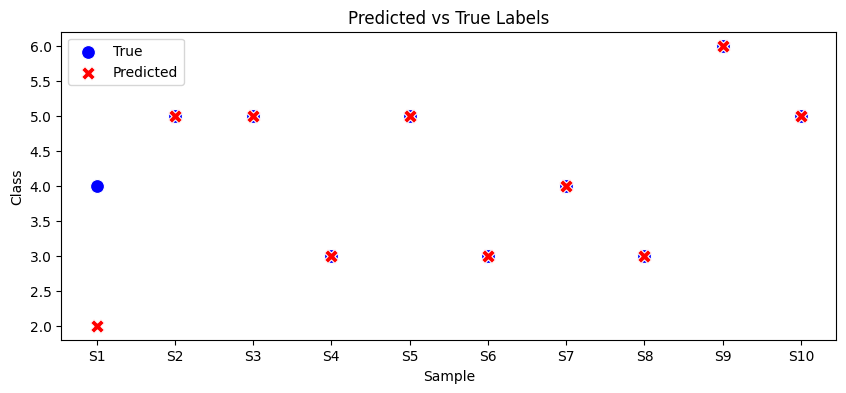

In [46]:
plt.figure(figsize=(10,4))
sns.scatterplot(x=range(len(y_true)), y=y_true, s=100, color="blue", label="True")
sns.scatterplot(x=range(len(dry_bean_predictions)), y=dry_bean_predictions, s=100, color="red", label="Predicted", marker="X")

plt.xticks(range(len(y_true)), labels=[f"S{i+1}" for i in range(len(y_true))])   # s1 -> sample1
plt.xlabel("Sample")
plt.ylabel("Class")
plt.title("Predicted vs True Labels")
plt.legend()
plt.show()


# Automatically Deleting the Latest SageMaker Endpoint

This cell **finds and deletes the most recently created SageMaker endpoint** to free up resources and avoid unnecessary costs:

- `list_endpoints(MaxResults=10)` → Lists the last 10 endpoints in your account.  
- `sorted(..., key=lambda x: x['CreationTime'])` → Sorts endpoints by creation time.  
- `latest_endpoint = ...` → Selects the newest endpoint.  
- `delete_endpoint(EndpointName=latest_endpoint)` → Deletes that endpoint from SageMaker.  

💡 **Tip:** Always delete endpoints you no longer need to **save AWS costs**.


In [48]:
##sm_boto3.delete_endpoint()
#sm_boto3.delete_endpoint(EndpointName=predictor.endpoint_name)


response = sm_boto3.list_endpoints(MaxResults=10)
endpoints_sorted = sorted(response['Endpoints'], key=lambda x: x['CreationTime'])
latest_endpoint = endpoints_sorted[-1]['EndpointName']

print("Deleting endpoint:", latest_endpoint)
sm_boto3.delete_endpoint(EndpointName=latest_endpoint)


Deleting endpoint: dry-bean-rf-model-2025-08-31-19-59-51


{'ResponseMetadata': {'RequestId': '5b5a3591-1cb6-4b1e-b944-c5c7f1735a4f',
  'HTTPStatusCode': 200,
  'HTTPHeaders': {'x-amzn-requestid': '5b5a3591-1cb6-4b1e-b944-c5c7f1735a4f',
   'content-type': 'application/x-amz-json-1.1',
   'date': 'Sun, 31 Aug 2025 20:36:33 GMT',
   'content-length': '0'},
  'RetryAttempts': 0}}